In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
from data_loader import loadData
train,val,test,loader = loadData("wmh_usp")

c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading training data...
Loading test data...
Found 110 test patients, 12 val patients, 48 train patients.
Added 124 train, 36 val, 330 test.
Loaded 124 train, 36 val, 330 test.


In [14]:
train[0][1][0].shape

(240, 240)

In [10]:
train[0][0][0].shape

(240, 240)

In [7]:
import numpy as np
np.unique(train[0][1][0])

array([0., 1.])

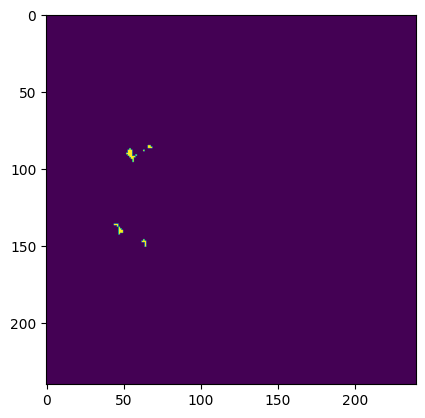

In [4]:
plt.imshow(train[0][1][0])

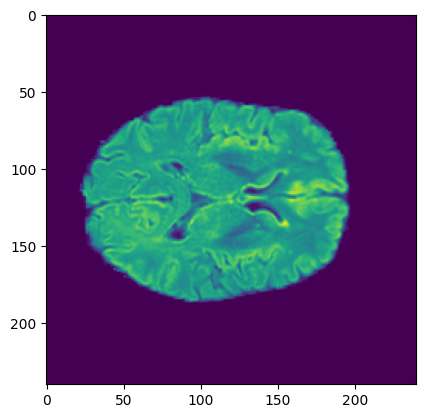

In [3]:
import matplotlib.pyplot as plt
plt.imshow(test[200][0][0])

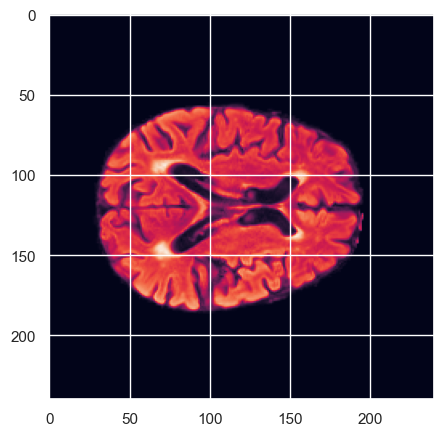

In [20]:
plt.imshow(test[10][0][0])

In [2]:
import torch
import torch.autograd as autograd
from torch import Tensor
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import datasets, transforms
import pickle
from PIL import Image
import numpy as np
import json        
from time import time
import os
import tempfile
import gc
import PIL
import matplotlib.pyplot as plt
import math
import random
import optuna
from optuna.trial import TrialState
from monai.apps import download_and_extract
from monai.config import print_config
from monai.data import decollate_batch, DataLoader
from monai.metrics import ROCAUCMetric
from monai.networks.nets import DenseNet121
from monai.transforms import (
    Activations,
    EnsureChannelFirst,
    AsDiscrete,
    Compose,
    LoadImage,
    RandFlip,
    RandRotate,
    RandZoom,
    ScaleIntensity,
    MaskIntensity,
    ThresholdIntensity
)
from monai.utils import set_determinism
from monai.transforms.utils import rescale_array

import seaborn as sns
sns.set(rc={'figure.figsize':(5,5)})

#
import nibabel as nib
from nibabel.testing import data_path
import os
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np

c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [45]:
ae = load_class("AutoEnc")
encoderdict = dict()
encoderdict['num_layers'] = 4
encoderdict['kernel_size'] = [3,2,4,2] 
encoderdict['stride'] = [1,2,1,1] 
encoderdict['padding'] = [1,1,1,2] 
encoderdict['dilation'] = [1,1,1,1] 
encoderdict['latent'] = 128 
ae = ae(**encoderdict)

In [54]:
gc.collect()

21

In [51]:
memDebugger()

CPU Usage (%): 19.8
svmem(total=34187886592, available=4223266816, percent=87.6, used=29964619776, free=4223266816)
Memory (GB): 9.924385070800781
Torch objects:
<class 'tuple'>
<class 'ValueError'>
<class 'traceback'>
<class 'frame'>
<class 'traceback'>
<class 'tuple'>
<class 'ValueError'>
<class 'traceback'>
<class 'frame'>
<class 'traceback'>
<class 'frame'>
<class 'traceback'>
<class 'frame'>
<class 'frame'>
<class 'frame'>
<class 'frame'>
<class 'list'>
<class 'dict'>
<class 'list'>
<class 'coroutine'>
<class 'tuple'>
<class 'ValueError'>
<class 'traceback'>
<class 'frame'>
<class 'traceback'>
<class 'tuple'>
<class 'ValueError'>
<class 'traceback'>
<class 'frame'>
<class 'traceback'>
<class 'frame'>
<class 'traceback'>
<class 'frame'>
<class 'frame'>
<class 'frame'>
<class 'frame'>
<class 'list'>
<class 'dict'>
<class 'list'>
<class 'coroutine'>
<class 'tuple'>
<class 'tuple'>
<class '_ctypes.PyCArrayType'>
<class 'getset_descriptor'>
<class 'getset_descriptor'>
<class 'tuple'>
<

In [46]:
x=torch.rand((200,1,64,64))
ae(x)

torch.Size([200, 32, 64, 64])
torch.Size([200, 64, 33, 33])
torch.Size([200, 128, 32, 32])
torch.Size([200, 128, 35, 35])
torch.Size([200, 16, 35, 35])
torch.Size([200, 19600])
torch.Size([200, 128])
torch.Size([200, 19600])
torch.Size([200, 16, 35, 35])
torch.Size([200, 128, 35, 35])
torch.Size([200, 128, 32, 32])
torch.Size([200, 128, 33, 33])
torch.Size([200, 64, 64, 64])
torch.Size([200, 32, 64, 64])
torch.Size([200, 1, 64, 64])


tensor([[[[0.4996, 0.5132, 0.4390,  ..., 0.5712, 0.4663, 0.4829],
          [0.6007, 0.5176, 0.3642,  ..., 0.4684, 0.5686, 0.3474],
          [0.5204, 0.2827, 0.6081,  ..., 0.3792, 0.5437, 0.3984],
          ...,
          [0.4255, 0.4325, 0.5894,  ..., 0.3979, 0.4415, 0.4184],
          [0.4109, 0.4109, 0.4776,  ..., 0.3606, 0.5297, 0.3704],
          [0.4161, 0.4327, 0.5069,  ..., 0.4599, 0.4018, 0.4189]]],


        [[[0.5644, 0.4676, 0.5223,  ..., 0.4765, 0.5166, 0.5003],
          [0.5424, 0.4691, 0.4770,  ..., 0.4276, 0.5746, 0.3886],
          [0.5492, 0.5363, 0.4348,  ..., 0.4850, 0.5573, 0.4131],
          ...,
          [0.5407, 0.4934, 0.5423,  ..., 0.4544, 0.5437, 0.3894],
          [0.4677, 0.5791, 0.4631,  ..., 0.3691, 0.4446, 0.3476],
          [0.4451, 0.4294, 0.5096,  ..., 0.3791, 0.4535, 0.3580]]],


        [[[0.5257, 0.5085, 0.4255,  ..., 0.4237, 0.5035, 0.5676],
          [0.5405, 0.4758, 0.3878,  ..., 0.3904, 0.5806, 0.3506],
          [0.5272, 0.2811, 0.4411,  ..

In [4]:
from utils import *
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resetSeeds() #helps when rerunning cells

In [13]:
from data_loader import loadData
from utils import *
from monai.data import decollate_batch, DataLoader
from loss_funcs import load_loss
from run_experiment import objective
import time

def loadobjective(trial):
    exp_name = "mnist_usp"
    model_name = "AutoEnc"
    batch_size = 125


    # Generate values
    optimizerdict = dict()
    optimizerdict['lr'] = 0.001
    b1= 0.71
    b2= 0.965 
    optimizerdict['betas']=(b1,b2)
    optimizerdict['weight_decay']=0.0002
    
    learnerdict = dict()
    learnerdict['gamma']=.75
    
    encoderdict = dict()
    encoderdict['num_layers'] = 4
    encoderdict['kernel_size'] = [3,2,4,2] 
    encoderdict['stride'] = [1,2,1,1] 
    encoderdict['padding'] = [1,1,1,2] 
    encoderdict['dilation'] = [1,1,1,1] 
    encoderdict['latent'] = 128 


    loss_name = "L1_Loss"


    loaderdict = dict()
    loaderdict['trial_num'] = trial.number
    loaderdict['exp_name'] = exp_name
    loaderdict['model_name'] = model_name
    loaderdict['loss_name'] = loss_name
    loaderdict['batch_size']= batch_size
    loaderdict['optimizerdict'] = optimizerdict
    loaderdict['learnerdict'] = learnerdict
    loaderdict['encoderdict'] = encoderdict
    max_epochs = 2
    loaderdict['max_epochs'] = max_epochs

    print(f"Testing model with parameters: {loaderdict}")
    #del train_x,val_x,test_x,train_ds,val_ds
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    return objective(trial,loaderdict,device)

In [26]:
vae_study = optuna.create_study(direction="minimize",study_name="teststudy")

vae_study.optimize(loadobjective, n_trials=1,timeout=14400,gc_after_trial=True,show_progress_bar=False)

pruned_trials = vae_study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = vae_study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(vae_study.trials))

print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = vae_study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2023-02-02 01:24:09,292] A new study created in memory with name: teststudy


Testing model with parameters: {'trial_num': 0, 'exp_name': 'mnist_usp', 'model_name': 'AutoEnc', 'loss_name': 'L1_Loss', 'batch_size': 125, 'optimizerdict': {'lr': 0.001, 'betas': (0.71, 0.965), 'weight_decay': 0.0002}, 'learnerdict': {'gamma': 0.75}, 'encoderdict': {'num_layers': 4, 'kernel_size': [3, 2, 4, 2], 'stride': [1, 2, 1, 1], 'padding': [1, 1, 1, 2], 'dilation': [1, 1, 1, 1], 'latent': 128}, 'max_epochs': 2}
Loaded files from data_folder.
Loaded 5943 train, 1981 val, 1981 test.
making model...
----------
epoch 1/2
TRAIN: epoch 1 average loss: 0.3927
(200, 1, 64, 64) (200, 1, 64, 64)
current epoch: 1 
current L1_Loss loss mean: 0.3537 
AUROC: 0.9871 AUPRC: 0.6502 DICE score: 0.7546 Threshold: 0.4932 
best L1_Loss loss mean: 0.3537 at epoch: 1
----------
epoch 2/2
TRAIN: epoch 2 average loss: 0.3100
(200, 1, 64, 64) (200, 1, 64, 64)
current epoch: 2 
current L1_Loss loss mean: 0.3306 
AUROC: 0.9861 AUPRC: 0.6422 DICE score: 0.7249 Threshold: 0.5235 
best L1_Loss loss mean: 0.3

[I 2023-02-02 01:24:19,822] Trial 0 finished with value: 0.33064281940460205 and parameters: {}. Best is trial 0 with value: 0.33064281940460205.


Saved model at experiments\0-mnist_usp-AutoEnc-L1_Loss-2023-02-02 09-24-09\model.pth.
Study statistics: 
  Number of finished trials:  1
  Number of pruned trials:  0
  Number of complete trials:  1
Best trial:
  Value:  0.33064281940460205
  Params: 


In [28]:
from run_experiment import test

In [32]:
test('0-mnist_usp-AutoEnc-L1_Loss-2023-02-02 09-24-09','experiments',device)

Loaded files from data_folder.
Loaded 5943 train, 1981 val, 1981 test.
making model...

L1_Loss loss mean: 0.3178 
AUROC: 0.9846 
AUPRC: 0.1363 
DICE score: 0.2133 
Threshold: 0.5339


0.3177635408937931

Loading training data...
Loading test data...
Found 110 test patients, 12 val patients, 48 train patients.
[0. 1. 2.]
2.0 0.0


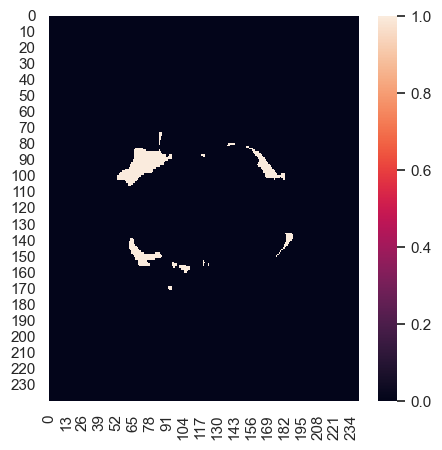

NameError: name 'wadsdasda' is not defined

In [176]:
root_dir= Path(r"E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse")
train,val,test = loadProperData("ae_usp_.1",root_dir,maskmax=True,data_source="dataverse")

In [136]:

batch_size = 8
train_ds = MedNISTDataset(train)
train_loader = DataLoader(train_ds, batch_size=batch_size,shuffle=True)

val_ds = MedNISTDataset(val)
val_loader = DataLoader(val_ds, batch_size=batch_size)

test_ds = MedNISTDataset(test)
test_loader = DataLoader(test_ds, batch_size=batch_size)

In [137]:
for im,mask in train_loader:
    print(im.shape)
    print(mask.shape)
    break

torch.Size([8, 1, 200, 200])
torch.Size([8, 1, 200, 200])


In [130]:
train[0][0].shape

(1, 200, 200)

In [165]:
def loadobjective(trial):
    experiment_type = "ae_usp_.1"
    from custommodels import AutoEnc,VAE,ConstrainedAE,babysfirstAE,SkipAE,AutoEnc_NoBottleneck
    batch_size = 8
    if "_semi_" in experiment_type:
        bt,at = experiment_type.split("_semi_")
        val_loader = []
        train_loader=[]
        tx1,tv1,tt1 = loadProperData(bt+"_usp_"+at,root_dir,maskmax=True,data_source="dataverse")
        t_ds1 =  MedNISTDataset(tx1)
        v_ds1 =  MedNISTDataset(tv1)
        tl1 = DataLoader(t_ds1, batch_size=batch_size,shuffle=True)
        train_loader.append(tl1)
        vl1 = DataLoader(v_ds1, batch_size=batch_size)
        val_loader.append(vl1)
        tx2,tv2,tt2 = loadProperData(bt+"_sp_"+at,root_dir,maskmax=True,data_source="dataverse")
        t_ds2 =  MedNISTDataset(tx2)
        v_ds2 =  MedNISTDataset(tv2)
        tl2 = DataLoader(t_ds2, batch_size=batch_size,shuffle=True)
        train_loader.append(tl2)
        vl2 = DataLoader(v_ds2, batch_size=batch_size)
        val_loader.append(vl2)
        modeltype = getModel(bt+"_usp_"+at)
    else:
        train_x,val_x,test_x = loadProperData(experiment_type,root_dir,maskmax=True,data_source="dataverse")
        train_ds = MedNISTDataset(train_x)
        train_loader = DataLoader(train_ds, batch_size=batch_size,shuffle=True)

        val_ds = MedNISTDataset(val_x) #MedNISTDataset(val_x)
        val_loader = DataLoader(val_ds, batch_size=batch_size)
        modeltype = getModel(experiment_type)

    #test_ds = MedNISTDataset(test_x)
    #test_loader = DataLoader(test_ds, batch_size=batch_size)

    # Generate values
    lr = 0.001 #trial.suggest_float("lr", 0.0008, 0.001, step=0.0001) #0.0008603126707594238
    b1= 0.71 #trial.suggest_float("b1", 0.70, 0.80, step=0.01) #0.7486940959505869 #trial.suggest_float("b1", 0.70, 0.95, log=True)
    b2= 0.965 #trial.suggest_float("b2", 0.85, 0.90, step=0.01) #0.8806252210130728 #trial.suggest_float("b2", 0.80, 0.995, log=True)
    betas=(b1,b2)
    weight_decay = 0.0002 #trial.suggest_float("weight_decay", 0, 0.0003,step=0.0001) #0.0002 #trial.suggest_float("weight_decay", 0, 0.0003,step=0.0001)
    gamma = .75 #trial.suggest_float("gamma",.75,1,step=.05) #0.9 #trial.suggest_float("gamma",0,0.15,step=.05)
    
    encoderdict = dict()
    encoderdict['num_layers'] = 4 #trial.suggest_int('num_layers',3,3) #15
    encoderdict['kernel_size'] = [3,2,4,2] #[trial.suggest_int('kernel_sizea',1,5),trial.suggest_int('kernel_sizeb',1,5),trial.suggest_int('kernel_sizec',1,5),trial.suggest_int('kernel_sized',1,5)] #trial.suggest_int('kernel_size',5,5)
    encoderdict['stride'] = [1,2,1,1] #[trial.suggest_int('stridea',1,2),trial.suggest_int('strideb',1,2),trial.suggest_int('stridec',1,2),trial.suggest_int('strided',1,2)] #trial.suggest_int('stride',2,2)
    encoderdict['padding'] = [1,1,1,2] #[trial.suggest_int('paddinga',1,2),trial.suggest_int('paddingb',1,2),trial.suggest_int('paddingc',1,2),trial.suggest_int('paddingd',1,2)] #trial.suggest_int('padding',1,1)
    encoderdict['dilation'] = [1,1,1,1] #trial.suggest_int('dilation',1,1)
    encoderdict['latent'] = 128 #trial.suggest_categorical('latent',[32,64,128])

    try:
        print("making model...")
        model = modeltype(**encoderdict,image_shape=200,input_size=1).to(device)
    except Exception as e: 
        print(str(e))
        raise optuna.exceptions.TrialPruned()
    if experiment_type=="ae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1"])
    elif experiment_type=="ae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["custom"])
    elif experiment_type=="ae_semi_.1":
        chosen_loss= trial.suggest_categorical("chosen_loss", ["L1#custom"])
    elif experiment_type=="vae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["KL"])
    elif experiment_type=="vae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["KL_sp"])
    elif experiment_type=="vae_semi_.1":
        chosen_loss= trial.suggest_categorical("chosen_loss", ["KL#KL_sp"])
    elif experiment_type=="cae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["cae"])
    elif experiment_type=="cae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["cae_sp"])
    elif experiment_type=="cae_semi_.1":
        chosen_loss= trial.suggest_categorical("chosen_loss", ["cae#cae_sp"])
    elif experiment_type=="nobottleae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1"])
    elif experiment_type=="nobottleae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["custom"])
    elif experiment_type=="nobottleae_semi_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1#custom"])
    elif experiment_type=="skipae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1"])
    elif experiment_type=="skipae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["custom"])
    elif experiment_type=="skipae_semi_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1#custom"]) 
    else:
        raise ValueError(f"Experiment {experiment_type} not found")
    
    print(f"Testing model with parameters: {lr},{betas},{weight_decay},{chosen_loss},{gamma},{encoderdict}")
    #del train_x,val_x,test_x,train_ds,val_ds
    return objective(trial,model,lr,betas,weight_decay,chosen_loss,gamma,encoderdict,train_loader,val_loader,experiment_type)

In [166]:
vae_study = optuna.create_study(direction="minimize",study_name="ae-usp-dataverse")

vae_study.optimize(loadobjective, n_trials=1,timeout=14400,gc_after_trial=True,show_progress_bar=False)

pruned_trials = vae_study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = vae_study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(vae_study.trials))

print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = vae_study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2023-01-13 02:32:19,965] A new study created in memory with name: ae-usp-dataverse


Loaded files from dataverse_data.
Loaded 472 train, 180 val, 1650 test.
making model...
Testing model with parameters: 0.001,(0.71, 0.965),0.0002,L1,0.75,{'num_layers': 4, 'kernel_size': [3, 2, 4, 2], 'stride': [1, 2, 1, 1], 'padding': [1, 1, 1, 2], 'dilation': [1, 1, 1, 1], 'latent': 128}
----------
epoch 1/10


[I 2023-01-13 02:32:23,010] Trial 0 pruned. 


Study statistics: 
  Number of finished trials:  1
  Number of pruned trials:  1
  Number of complete trials:  0
Best trial:


ValueError: No trials are completed yet.

In [167]:
def loadobjective(trial):
    experiment_type = "ae_sp_.1"
    from custommodels import AutoEnc,VAE,ConstrainedAE,babysfirstAE,SkipAE,AutoEnc_NoBottleneck
    batch_size = 8
    if "_semi_" in experiment_type:
        bt,at = experiment_type.split("_semi_")
        val_loader = []
        train_loader=[]
        tx1,tv1,tt1 = loadProperData(bt+"_usp_"+at,root_dir,maskmax=True,data_source="dataverse")
        t_ds1 =  MedNISTDataset(tx1)
        v_ds1 =  MedNISTDataset(tv1)
        tl1 = DataLoader(t_ds1, batch_size=batch_size,shuffle=True)
        train_loader.append(tl1)
        vl1 = DataLoader(v_ds1, batch_size=batch_size)
        val_loader.append(vl1)
        tx2,tv2,tt2 = loadProperData(bt+"_sp_"+at,root_dir,maskmax=True,data_source="dataverse")
        t_ds2 =  MedNISTDataset(tx2)
        v_ds2 =  MedNISTDataset(tv2)
        tl2 = DataLoader(t_ds2, batch_size=batch_size,shuffle=True)
        train_loader.append(tl2)
        vl2 = DataLoader(v_ds2, batch_size=batch_size)
        val_loader.append(vl2)
        modeltype = getModel(bt+"_usp_"+at)
    else:
        train_x,val_x,test_x = loadProperData(experiment_type,root_dir,maskmax=True,data_source="dataverse")
        train_ds = MedNISTDataset(train_x)
        train_loader = DataLoader(train_ds, batch_size=batch_size,shuffle=True)

        val_ds = MedNISTDataset(val_x) #MedNISTDataset(val_x)
        val_loader = DataLoader(val_ds, batch_size=batch_size)
        modeltype = getModel(experiment_type)

    #test_ds = MedNISTDataset(test_x)
    #test_loader = DataLoader(test_ds, batch_size=batch_size)

    # Generate values
    lr = 0.001 #trial.suggest_float("lr", 0.0008, 0.001, step=0.0001) #0.0008603126707594238
    b1= 0.71 #trial.suggest_float("b1", 0.70, 0.80, step=0.01) #0.7486940959505869 #trial.suggest_float("b1", 0.70, 0.95, log=True)
    b2= 0.965 #trial.suggest_float("b2", 0.85, 0.90, step=0.01) #0.8806252210130728 #trial.suggest_float("b2", 0.80, 0.995, log=True)
    betas=(b1,b2)
    weight_decay = 0.0002 #trial.suggest_float("weight_decay", 0, 0.0003,step=0.0001) #0.0002 #trial.suggest_float("weight_decay", 0, 0.0003,step=0.0001)
    gamma = .75 #trial.suggest_float("gamma",.75,1,step=.05) #0.9 #trial.suggest_float("gamma",0,0.15,step=.05)
    
    encoderdict = dict()
    encoderdict['num_layers'] = 4 #trial.suggest_int('num_layers',3,3) #15
    encoderdict['kernel_size'] = [3,2,4,2] #[trial.suggest_int('kernel_sizea',1,5),trial.suggest_int('kernel_sizeb',1,5),trial.suggest_int('kernel_sizec',1,5),trial.suggest_int('kernel_sized',1,5)] #trial.suggest_int('kernel_size',5,5)
    encoderdict['stride'] = [1,2,1,1] #[trial.suggest_int('stridea',1,2),trial.suggest_int('strideb',1,2),trial.suggest_int('stridec',1,2),trial.suggest_int('strided',1,2)] #trial.suggest_int('stride',2,2)
    encoderdict['padding'] = [1,1,1,2] #[trial.suggest_int('paddinga',1,2),trial.suggest_int('paddingb',1,2),trial.suggest_int('paddingc',1,2),trial.suggest_int('paddingd',1,2)] #trial.suggest_int('padding',1,1)
    encoderdict['dilation'] = [1,1,1,1] #trial.suggest_int('dilation',1,1)
    encoderdict['latent'] = 128 #trial.suggest_categorical('latent',[32,64,128])

    try:
        print("making model...")
        model = modeltype(**encoderdict,image_shape=200,input_size=1).to(device)
    except Exception as e: 
        print(str(e))
        raise optuna.exceptions.TrialPruned()
    if experiment_type=="ae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1"])
    elif experiment_type=="ae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["custom"])
    elif experiment_type=="ae_semi_.1":
        chosen_loss= trial.suggest_categorical("chosen_loss", ["L1#custom"])
    elif experiment_type=="vae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["KL"])
    elif experiment_type=="vae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["KL_sp"])
    elif experiment_type=="vae_semi_.1":
        chosen_loss= trial.suggest_categorical("chosen_loss", ["KL#KL_sp"])
    elif experiment_type=="cae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["cae"])
    elif experiment_type=="cae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["cae_sp"])
    elif experiment_type=="cae_semi_.1":
        chosen_loss= trial.suggest_categorical("chosen_loss", ["cae#cae_sp"])
    elif experiment_type=="nobottleae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1"])
    elif experiment_type=="nobottleae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["custom"])
    elif experiment_type=="nobottleae_semi_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1#custom"])
    elif experiment_type=="skipae_usp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1"])
    elif experiment_type=="skipae_sp_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["custom"])
    elif experiment_type=="skipae_semi_.1":
        chosen_loss = trial.suggest_categorical("chosen_loss", ["L1#custom"]) 
    else:
        raise ValueError(f"Experiment {experiment_type} not found")
    
    print(f"Testing model with parameters: {lr},{betas},{weight_decay},{chosen_loss},{gamma},{encoderdict}")
    #del train_x,val_x,test_x,train_ds,val_ds
    return objective(trial,model,lr,betas,weight_decay,chosen_loss,gamma,encoderdict,train_loader,val_loader,experiment_type)

In [168]:
vae_study = optuna.create_study(direction="minimize",study_name="ae-sp-dataverse")

vae_study.optimize(loadobjective, n_trials=1,timeout=14400,gc_after_trial=True,show_progress_bar=False)

pruned_trials = vae_study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = vae_study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(vae_study.trials))

print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = vae_study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2023-01-13 02:32:45,164] A new study created in memory with name: ae-sp-dataverse


Loading training data...
Loading test data...
Found 110 test patients, 12 val patients, 48 train patients.
Added 720 train, 180 val, 1650 test.
making model...
Testing model with parameters: 0.001,(0.71, 0.965),0.0002,custom,0.75,{'num_layers': 4, 'kernel_size': [3, 2, 4, 2], 'stride': [1, 2, 1, 1], 'padding': [1, 1, 1, 2], 'dilation': [1, 1, 1, 1], 'latent': 128}
----------
epoch 1/10
TRAIN: epoch 1 average loss: 0.4986
current epoch: 1 
current custom loss mean: 0.4849 
AUROC: 0.1935 AUPRC: 0.0015 DICE score: 0.0050 Threshold: 0.0000 
best custom loss mean: 0.4849 at epoch: 1
----------
epoch 2/10
TRAIN: epoch 2 average loss: 0.5081
current epoch: 2 
current custom loss mean: 0.4730 
AUROC: 0.2641 AUPRC: 0.0017 DICE score: 0.0050 Threshold: 0.0000 
best custom loss mean: 0.4730 at epoch: 2
----------
epoch 3/10
TRAIN: epoch 3 average loss: 0.4995
current epoch: 3 
current custom loss mean: 0.4713 
AUROC: 0.2640 AUPRC: 0.0017 DICE score: 0.0051 Threshold: 0.0748 
best custom loss mean

[I 2023-01-13 02:53:43,099] Trial 0 finished with value: 0.46875155490377673 and parameters: {'chosen_loss': 'custom'}. Best is trial 0 with value: 0.46875155490377673.


Study statistics: 
  Number of finished trials:  1
  Number of pruned trials:  0
  Number of complete trials:  1
Best trial:
  Value:  0.46875155490377673
  Params: 
    chosen_loss: custom


In [171]:
from customfunctions import test

In [173]:
test('0-ae_sp_.1,custom,0.001,(0.71, 0.965),0.0002,0.75-num_layers#4&kernel_size#[3, 2, 4, 2]&stride#[1, 2, 1, 1]&padding#[1, 1, 1, 2]&dilation#[1, 1, 1, 1]&latent#128',root_dir,True)

Loaded files from dataverse_data.
Loaded 720 train, 180 val, 1650 test.

custom loss mean: 0.4707 
AUROC: 0.1926 
AUPRC: 0.0014 
DICE score: 0.0039 
Threshold: 0.0220


0.4706892584051405

In [174]:
test('01-ae_usp_.1,L1,0.001,(0.71, 0.965),0.0002,0.75-num_layers#4&kernel_size#[3, 2, 4, 2]&stride#[1, 2, 1, 1]&padding#[1, 1, 1, 2]&dilation#[1, 1, 1, 1]&latent#128',root_dir,True)

Loaded files from dataverse_data.
Loaded 472 train, 180 val, 1650 test.

L1 loss mean: 0.0349 
AUROC: 0.7316 
AUPRC: 0.0047 
DICE score: 0.0105 
Threshold: 0.0150


0.034889900849925146

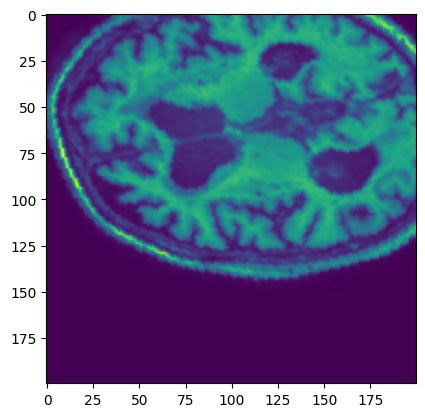

In [111]:
plt.imshow(train[0][0])

In [157]:
init_path = r"E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training"
init_path = Path(init_path)

def getPatients(init_path):
    for dir in os.listdir(init_path):
        img_source = dir
        #print(f"Img Source ({img_source}):")
        for patient_num in os.listdir(init_path / img_source):
            if patient_num.isnumeric() == False:
                scanner_path = patient_num
                for patient_num in os.listdir(init_path / img_source / scanner_path):
                    temp_path = init_path / img_source / scanner_path / patient_num
                    #print(init_path / img_source / scanner_path / patient_num)
                    yield temp_path
            else:
                temp_path = init_path / img_source / patient_num
                #print(init_path / img_source / patient_num)
                yield temp_path

for file in getPatients(init_path):
    t1_name = "pre/T1.nii.gz"
    flair_name = "pre/FLAIR.nii.gz"
    mask_name = "wmh.nii.gz"
    t1_path = file / t1_name
    flair_path = file / flair_name
    mask_path = file / mask_name
    print(mask_path)

E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\63\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\69\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\65\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\54\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\68\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\60\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\52\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\67\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\53\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Singapore\56\wmh.nii.gz
E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-

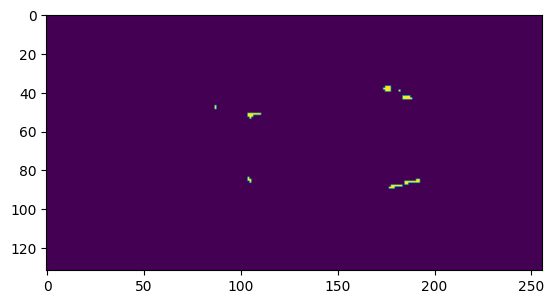

In [158]:
ans = Path(r"E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\additional_annotations\observer_o3\training\Amsterdam\GE3T\100\result.nii.gz")
ans = nib.load(ans)
mask = ans.get_fdata()
ans.shape
plt.imshow(mask[:,:,50])

In [110]:
ans = Path(r"E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\training\Amsterdam\GE3T\100\wmh.nii.gz")
ans = nib.load(ans)

In [111]:
mask = ans.get_fdata()
ans.shape

(132, 256, 83)

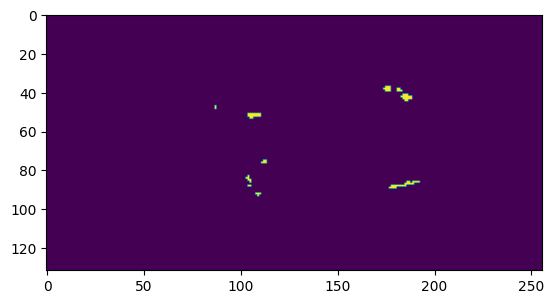

In [135]:
plt.imshow(mask[:,:,50])

In [87]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)

In [29]:
print(img.header)

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 132 256  83   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : uint16
bitpix          : 16
slice_start     : 0
pixdim          : [1.     1.2    0.9766 3.     0.     0.     0.     0.    ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 2
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b''
aux_file        : b''
qform_code      : aligned
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 1.0
qoffset_x       : 77.1333
qoffset_y       : 159.634
qoffset_z       : -143.7237
srow_x   

In [46]:
img.shape

(132, 256, 83)

In [39]:
img.slicer[0:1].get_fdata().shape

(1, 256, 83)

In [92]:
test = img.get_fdata()

In [144]:
def process(brainimg):
    mean = np.mean(brainimg)
    std = np.std(brainimg)
    resval = (brainimg-mean)/std
    resval = np.pad(resval,((0,0),(0,200),(0,200)),mode='constant')
    return resval

In [145]:
process(test).shape

(132, 456, 283)

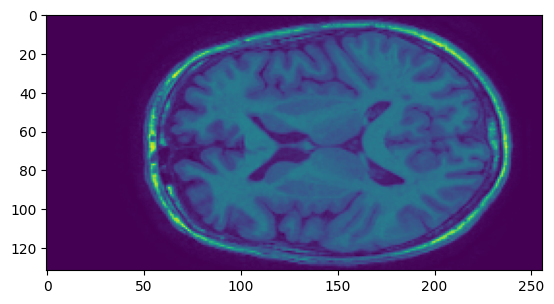

In [121]:
plt.imshow(test[:,:,50])

In [99]:
import numpy as np
import matplotlib.pyplot as plt

In [96]:
np.mean(test,axis=0).shpae

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
x -= np.mean(x, axis=0)
x /= np.std(x, axis=0)

In [89]:
img*2

TypeError: unsupported operand type(s) for *: 'Nifti1Image' and 'int'

In [86]:
img.get_fdata().shape

(132, 256, 83)

(132, 256, 83)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  """Entry point for launching an IPython kernel.


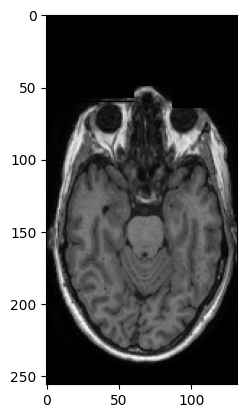

In [55]:
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

(132, 256, 83)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


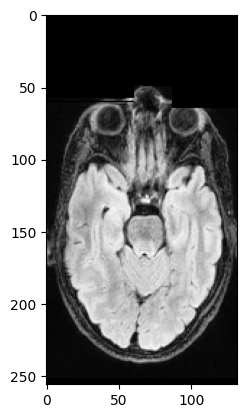

In [56]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\FLAIR.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


(256, 256, 176)


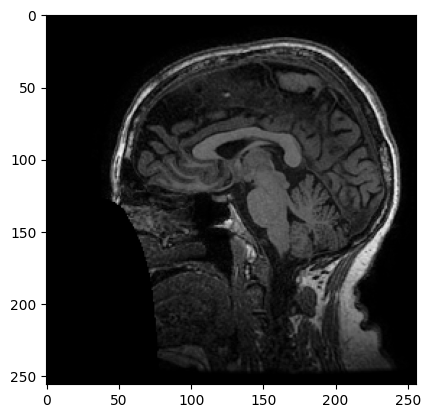

In [61]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\3DT1.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

(132, 256, 83)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


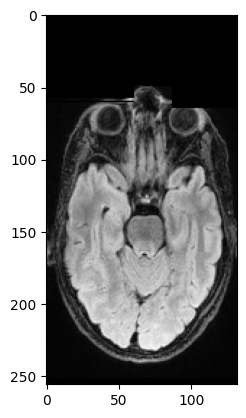

In [62]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\orig\\FLAIR.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

(256, 256, 176)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


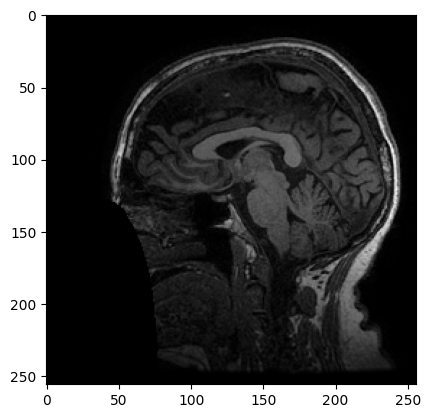

In [63]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\orig\\3DT1.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

(256, 256, 176)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


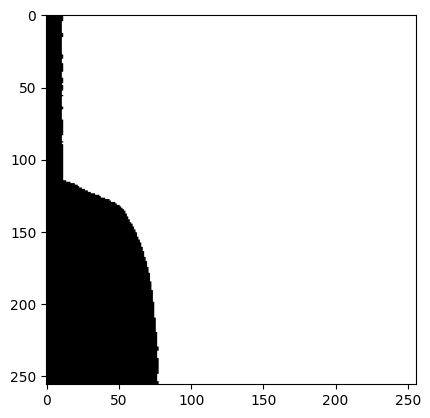

In [64]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\orig\\3DT1_mask.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

(132, 256, 83)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


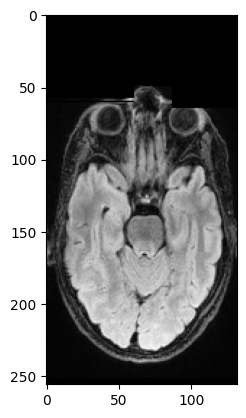

In [65]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\orig\\FLAIR.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

(132, 256, 83)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


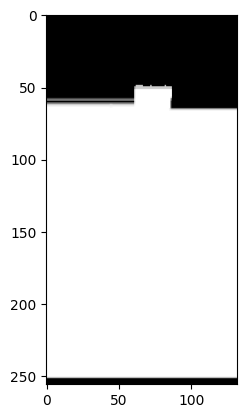

In [67]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\orig\\FLAIR_mask.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

(132, 256, 83)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


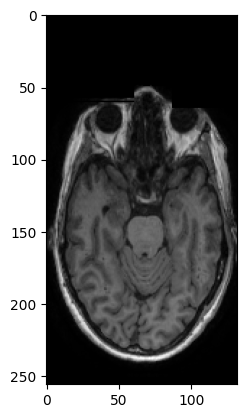

In [75]:
file = Path(r"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\orig\\T1.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

(132, 256, 83)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


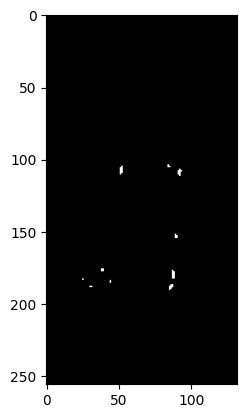

In [84]:
file = Path(r"E:\SCHOOL\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\additional_annotations\observer_o3\training\Amsterdam\GE3T\100\result.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2+10].T, cmap='Greys_r')
print(img.shape)

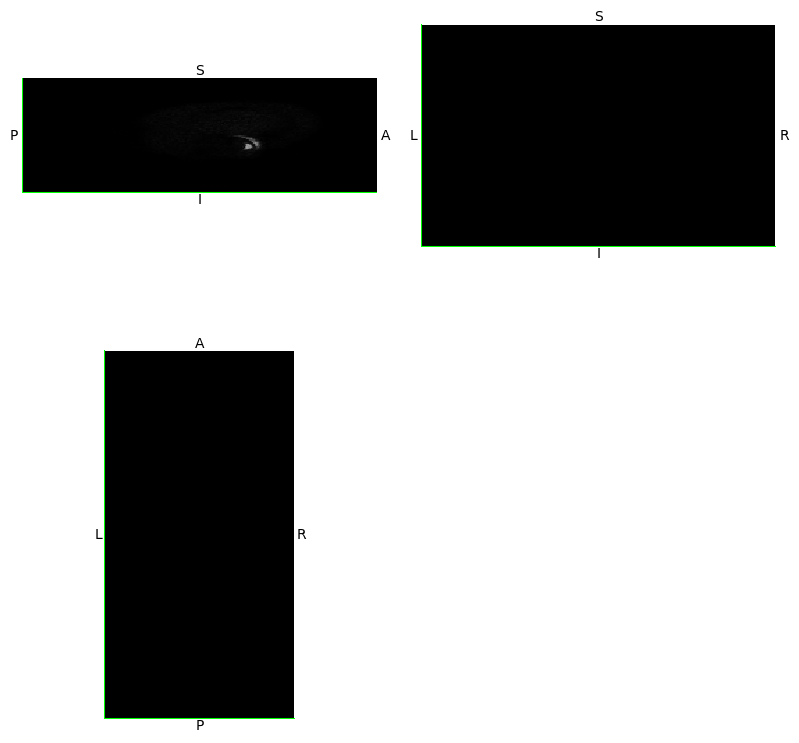

In [82]:
nib.viewers.OrthoSlicer3D(img.get_fdata()).show()  

(132, 256, 83)


c:\Users\irose\miniconda3\envs\mriproj\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


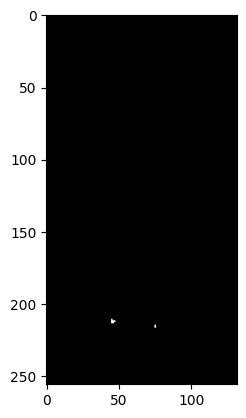

In [73]:
file = Path(r"E:\school\FINISHED\CS274E\CS-274E-Brain-Segmentation\dataverse\additional_annotations\observer_o3\training\Amsterdam\GE3T\100\result.nii.gz") #"E:\\SCHOOL\\FINISHED\\CS274E\\CS-274E-Brain-Segmentation\\dataverse\\training\\Amsterdam\\GE3T\\100\pre\\T1.nii.gz"
img = nib.load(file)
plt.imshow(img.get_data()[:, :,img.shape[2] // 2].T, cmap='Greys_r')
print(img.shape)

In [42]:
img.slicer[0:1].get_fdata()

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]])

In [40]:
import matplotlib.pyplot as plt
plt.imread(img.slicer[0:1].get_fdata()[0])

AttributeError: 'numpy.ndarray' object has no attribute 'read'